# Oriented FAST and Rotated BRIEF (ORB)

One of the most challenging problems in computer vision is object detection. Object detection is the ability is the ability to recognize particular objects in images and being able to determine the location of those objects within the images. For example, if we perform car detection in the image below, we will not only be interested in saying how many cars are there in the image but also where those cars are in the image.

In order to perform this object-based image analysis, will use ORB. ORB is a very fast algorithm that creates feature vectors from detected keypoints. You've learned that ORB has some great properties, such as being invariant to rotations, changes in illumination, and noise.

In this notebook, we will see these properties in action and implement the ORB algorith to detect a person's face in an image using facial keypoints.

## Loading images and importing resources

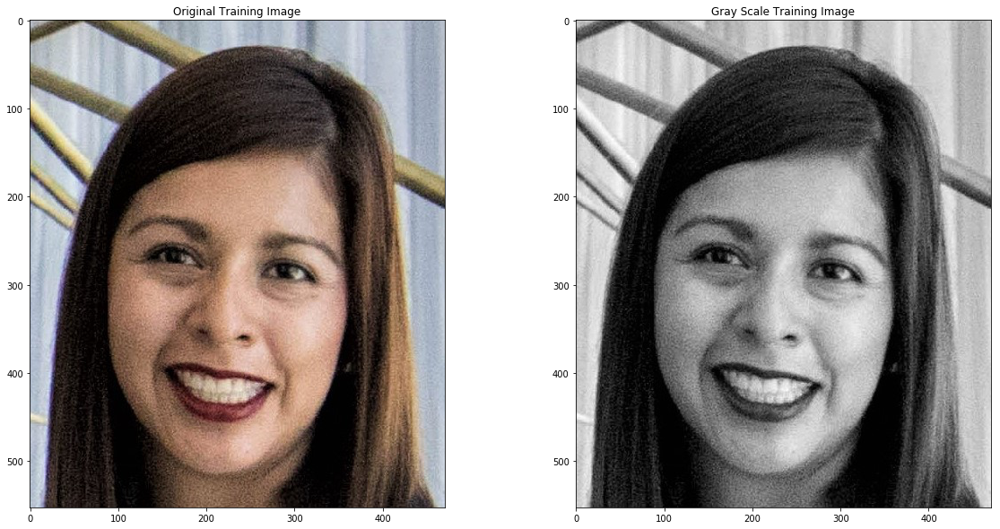

In [1]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [20,10]

# Load the training image
image = cv2.imread('./images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Convert the training image to gray Scale
training_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Display the images
plt.subplot(121)
plt.title('Original Training Image')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Gray Scale Training Image')
plt.imshow(training_gray, cmap='gray')
plt.show()

## Locating Keypoints

The first step in the ORB algorithm is to locate all the keypoints in the training image. After the keypoints have been located, ORB creates their corresponding binary feature vectors and groups them together in the ORB descriptor.

We will use OpenCV's *ORB* class to locate the keypoints and create their corresponding ORB descriptor. The parameters of the ORB algorithm are setup using the *ORB_create()* function. The parameters of the *ORB_create()* function and their default values are given below:

```
cv2.ORB_create(nfeatures = 500,
               scaleFactor = 1.2,
               nlevels = 8,
               edgeThreshold = 31,
               firstLevel = 0,
               WTA_K = 2,
               scoreType = HARRIS_SCORE,
               patchSize = 31,
               fastThreshold = 20)
```

Parameters:
- **nfeatures** - int

Determines the maximum number of features(keypoints) to locate.
- **scaleFactor** - float

Pyramid decimation ratio, must be greater than 1. ORB uses an image pyramid to find features, therefore you must provide the scale factor between each layer in the pyramid and the number of levels the pyramid has. A *scaleFactor = 2* means the classical pyramid, where each next level has 4x less pixels than the previous. A big scale factor will diminish the number of features found.

- **edgeThreshold** - int

The size of the border where features are not detected. Since the keypoints have a specific pixel size, the edges of images must be excluded from the search. The size of the *edgeThreshold* should be equal to or greater than the patchSize parameter.

- **firstLevel** - int

This parameter allows us to determine which should be treated as the first level in the pyramid. It should be 0 in the current implementation. Usually, the pyramid level with a scale of unity is consired the first level.

- **WTA_K** - int

The number of random pixels used to produce each element of the oriented BRIEF descripter. The possible values are 2, 3, and 4, with 2 being the default value. For example, a value of 3 means three random pixels are chosen at a time to compate their brightness. The index of the brightest pixel is returned. Since there are 3 pixels, the returned index will be either 0, 1 or 2.

- **scoreType** - int

This parameter can be set to either HARRIS_SCORE or FAST_SCORE. The default HARRIS_SCORE means that the Harris corner algorithm is used to rank features. The score is used to only retain the best features. The FAST_SCORE produces slightly less stable keypoints, but it is a little faster to compute.

- **patchSize** - int

Size of the patch used by the oriented BRIEF descriptor. Of course, on smaller pyramid layers the perceived image area covered by a feature will be larger.

As we can see, the *cv2.ORB_create()* function supports a wide range of parameters. The first two arguments (*nfeatures* and *scaleFactor*) are probably the ones we are most likely to change.

In the code below, after *ORB_create()* we will then use the *.detectAndCompute(image)* method to locate the keypoints in the given training image and to compute their corresponding ORB descriptor. Finally, we will use the *cv2.drawKeypoints()* function to visualize the keypoints found by the ORB algorithm.

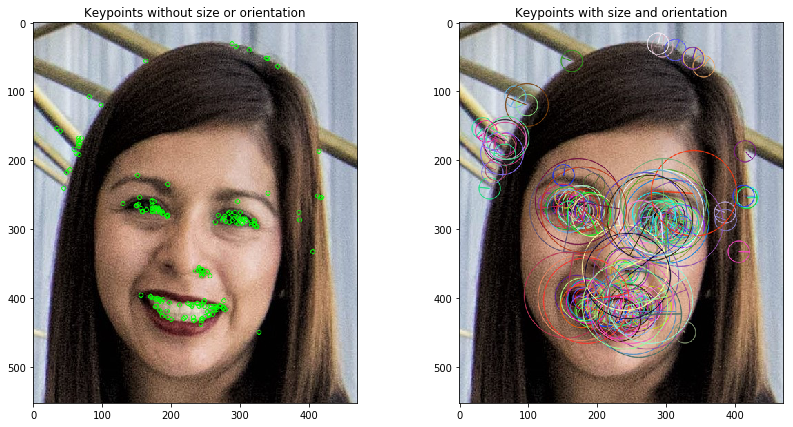


Number of keypoints detected:  175


In [2]:
# Import copy to make copies of the training image
import copy

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Set the parameters of the RGB algorithm by 
# specifying the maximum number of keypoints
# to locate and the pyramid decimation ratio
orb = cv2.ORB_create(200, 2.0)

# Find the keypoints in the gray scale training image
# and compute their ORB descriptor. The None
# parameter is needed to indicate that we are
# not using a mask
keypoints, descriptor = orb.detectAndCompute(training_gray, None)

# Create copies of the training image to draw our
# keypoints on
keyp_without_size = copy.copy(training_image)
keyp_with_size = copy.copy(training_image)

# Draw the keypoints without size or orientation
# on one copy of the training image
cv2.drawKeypoints(training_image, keypoints, 
                  keyp_without_size,
                  color = (0,255,0))

# Draw the keypoint with size or orientation
# on one copy of the training image
cv2.drawKeypoints(training_image, keypoints, 
                  keyp_with_size,
                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
                 )

# Display the image with keypoints without size
# or orientation
plt.subplot(121)
plt.title('Keypoints without size or orientation')
plt.imshow(keyp_without_size)

# Display the image with keypoints with size
# and orientation
plt.subplot(122)
plt.title('Keypoints with size and orientation')
plt.imshow(keyp_with_size)
plt.show()

# Print the number of keypoints detected
print('\nNumber of keypoints detected: ',len(keypoints))

As we can see in the right image, every keypoint has a center, a size, and an angle. The center determines the location of each keypoint in the image; the size of each keypoint is determined by the patch size used by BRIEF to create its feature vector; and the angle tells us the orientation of the keypoint as determined by rBRIEF.

Once the keypoints for the training image have been found and their corresponding ORB descriptor has been calculated, the same thing can be done for the query image.

# Feature Matching

The final step is to perform keypoint matching between the two images using their corresponding ORB descriptors. This matching is usually performed by a matching function. One of the most commonly used matching functions is called Brute-Force.

We will use OpenCV's *BFMatcher* class to compare the keypoints in the training and query images. The parameters of the Brute-Force matcher are setup using the *cv2.BFMatcher()* function. The default values:

```
cv2.BFMatcher(normType = cv2.NORM_L2, 
                         crossCheck = false)
```

Parameters:

- **normType**

Specifies the metric used to determine the quality of the match. By default, *normType = cv2.NORM_L2*, which measures the distance between two descriptors. However, for binary descriptors like the ones created by ORB, the Hamming metric is more suitable. The Hamming metric determines the distance by counting the number of dissimilar bits between the binary descriptors. When ORB descriptor is created using *WTA_K =2*, two random pixels are chosen and compared in brightness. The index of the brightest pixel is returned as either 0 or 1. Such output only occupies 1 bit, and there the *cv2.NORM_HAMMING* metric should be used.

- **crossCheck** bool

A Boolean variable. Cross-checking is very useful for eliminating false matches. It works by performing the matching procedure two times.

Once the parameteres of the *BFMatcher* have been set, we use the *.match(descriptors_train, descriptors_query)* method to find the matching keypoints between the training and query images using their ORB descriptors. Finally, we wil use the *cv2.drawMatches()* function to visualize the matching keypoinys found by the Brute-Force matcher. This function stacks the training and query images horizontally and draw lines from the keypoits in the training image to their corresponding best matching keypoints in the query image.

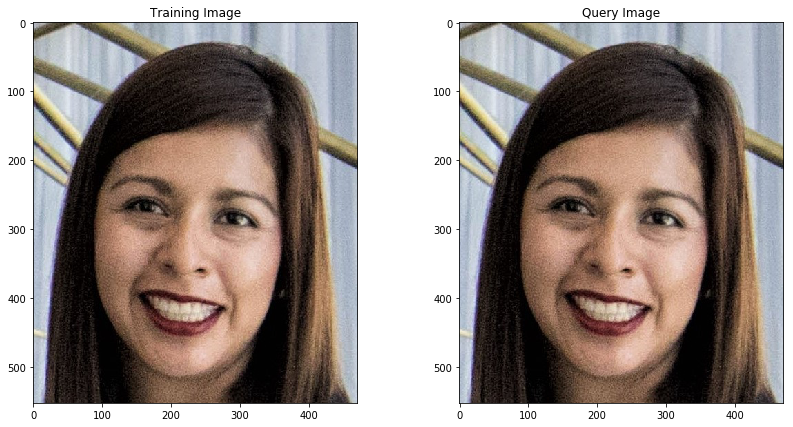

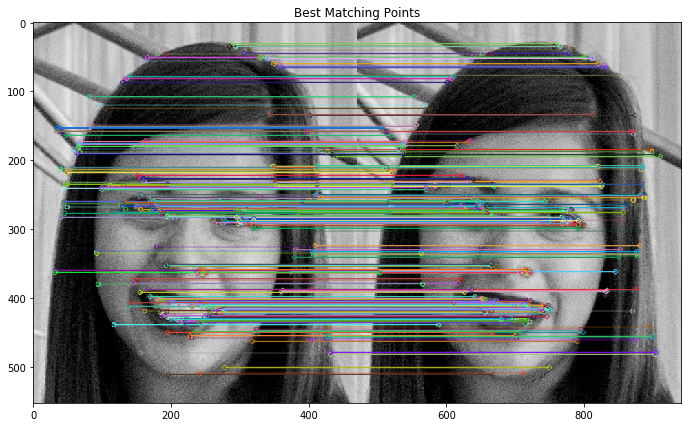

Number of keypoints detected in the training image:  822
Number of keypoints detected in the query image:  822

Number of matching keypoints between the training and query image:  822


In [3]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/face.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, 
                              cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)

plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image,
                             cv2.COLOR_RGB2GRAY)

# Convert the training image to gray scale
query_gray = cv2.cvtColor(query_image,
                             cv2.COLOR_RGB2GRAY)

# Set the parameters of the ORB algorithm by
# specifying the max number of keypoints to
# locate and the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck
# to True so that the BFMatcher will only return
# consistent pairs. Such technique usually produces
# best results with min number of outliers when
# there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, 
                   crossCheck = True)

# Perform the matching between the ORB descriptors of
# the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones 
# we want. So, we sort the matches according
# to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with
# their best matching keypoints in the query image.
# The best matches correspond to the first elements
# in the sorted matches list, since they are the
# ones with the shorter distance. We draw the first
# 300 matches and use flags = 2 to plot the matching
# keypoints without size or orientation
result = cv2.drawMatches(training_gray,
                         keypoints_train,
                         query_gray,
                         keypoints_query,
                         matches[:300],
                         query_gray,
                         flags=2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of the keypoints detected in the
# training image
print("Number of keypoints detected in the training image: ", len(keypoints_train))
# Print the number of the keypoints detected in the
# query image
print("Number of keypoints detected in the query image: ", len(keypoints_query))
# Print total number of matching points between the
# training and query image
print("\nNumber of matching keypoints between the training and query image: ", len(matches))


Since both the training and query images are the exactly the same, we expect that the same number of keypoints are found in both images, and that all the keypoints match. We can see that, ORB has found the same number of keypoints in both images and the Brute-Force matcher has been able to correctly match all the keypoints in training and query images.

## Scale Invariance

The ORB algorithm is scale invariant. This means that it is able to detect objects in images 

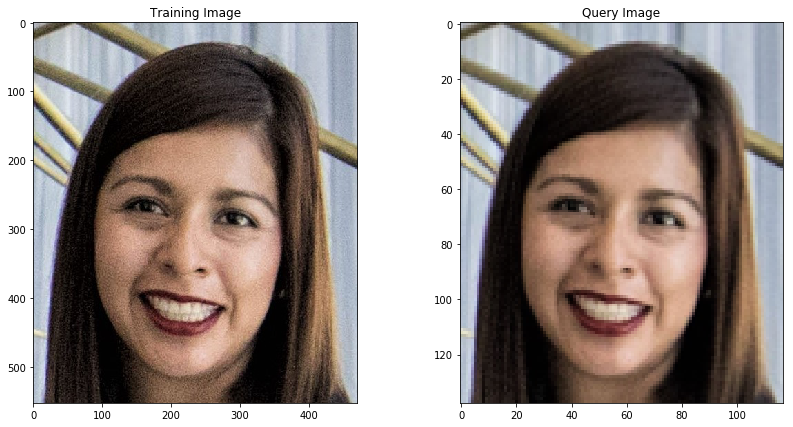

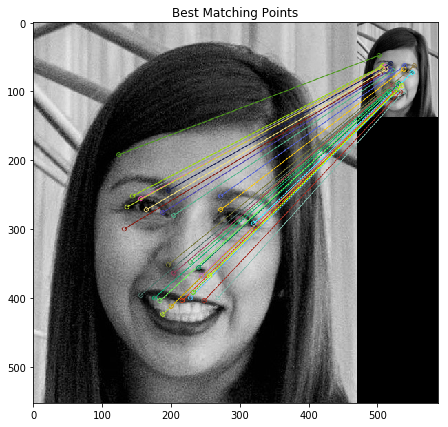

Number of keypoints detected in the training image:  822
Number of keypoints detected in the query image:  67

Number of matching keypoints between the training and query image:  61


In [5]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/faceQS.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, 
                              cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)

plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image,
                             cv2.COLOR_RGB2GRAY)

# Convert the training image to gray scale
query_gray = cv2.cvtColor(query_image,
                             cv2.COLOR_RGB2GRAY)

# Set the parameters of the ORB algorithm by
# specifying the max number of keypoints to
# locate and the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck
# to True so that the BFMatcher will only return
# consistent pairs. Such technique usually produces
# best results with min number of outliers when
# there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, 
                   crossCheck = True)

# Perform the matching between the ORB descriptors of
# the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones 
# we want. So, we sort the matches according
# to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with
# their best matching keypoints in the query image.
# The best matches correspond to the first elements
# in the sorted matches list, since they are the
# ones with the shorter distance. We draw the first
# 30 matches and use flags = 2 to plot the matching
# keypoints without size or orientation
result = cv2.drawMatches(training_gray,
                         keypoints_train,
                         query_gray,
                         keypoints_query,
                         matches[:30],
                         query_gray,
                         flags=2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of the keypoints detected in the
# training image
print("Number of keypoints detected in the training image: ", len(keypoints_train))
# Print the number of the keypoints detected in the
# query image
print("Number of keypoints detected in the query image: ", len(keypoints_query))
# Print total number of matching points between the
# training and query image
print("\nNumber of matching keypoints between the training and query image: ", len(matches))


In the above example, notice that the training image is 553 x 471 pixels, while the query image is 138 x 117 pixels, 1/4 the size of the original training image. Also notice that the number of keypoints detected in the query image is only 64, much smaller than the 831 keypoints found in the training image.

## Rotational Invariance

The ORB algorithm is also rotationally invariant. Here, in this example, query image has been rotated by 90 degrees.

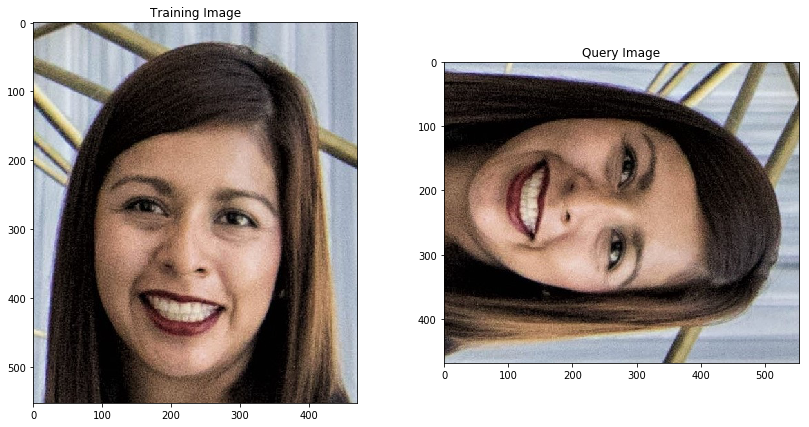

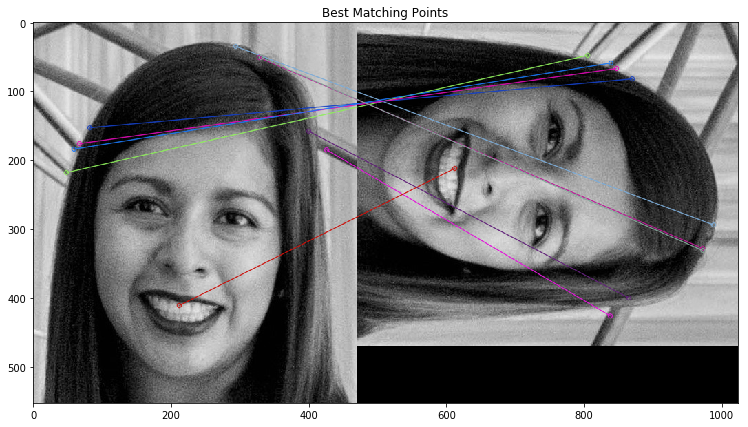

Number of keypoints detected in the training image:  822
Number of keypoints detected in the query image:  832

Number of matching keypoints between the training and query image:  653


In [6]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/faceR.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, 
                              cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)

plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image,
                             cv2.COLOR_RGB2GRAY)

# Convert the training image to gray scale
query_gray = cv2.cvtColor(query_image,
                             cv2.COLOR_RGB2GRAY)

# Set the parameters of the ORB algorithm by
# specifying the max number of keypoints to
# locate and the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck
# to True so that the BFMatcher will only return
# consistent pairs. Such technique usually produces
# best results with min number of outliers when
# there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, 
                   crossCheck = True)

# Perform the matching between the ORB descriptors of
# the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones 
# we want. So, we sort the matches according
# to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with
# their best matching keypoints in the query image.
# The best matches correspond to the first elements
# in the sorted matches list, since they are the
# ones with the shorter distance. We draw the first
# 100 matches and use flags = 2 to plot the matching
# keypoints without size or orientation
result = cv2.drawMatches(training_gray,
                         keypoints_train,
                         query_gray,
                         keypoints_query,
                         matches[:10],
                         query_gray,
                         flags=2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of the keypoints detected in the
# training image
print("Number of keypoints detected in the training image: ", len(keypoints_train))
# Print the number of the keypoints detected in the
# query image
print("Number of keypoints detected in the query image: ", len(keypoints_query))
# Print total number of matching points between the
# training and query image
print("\nNumber of matching keypoints between the training and query image: ", len(matches))


Even thoug the query image is rotated, Brute-Force matcher can still match about 78% of the key points found.

## Illumination Invariance

The ORB algorithm is also illumination invariant. Here, in this example, query image is much brighter.

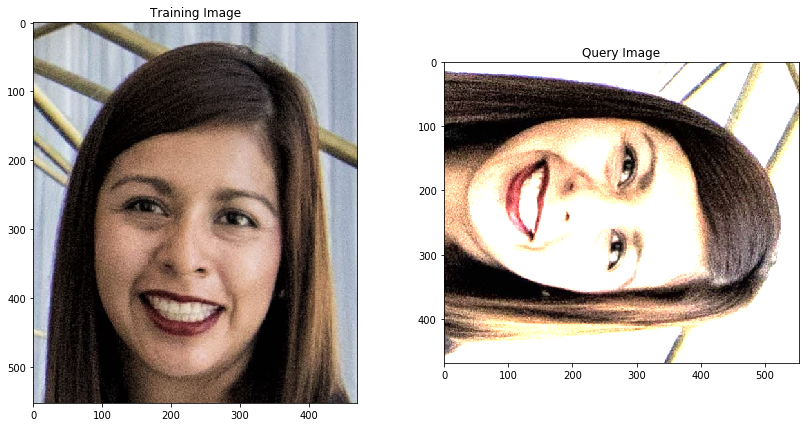

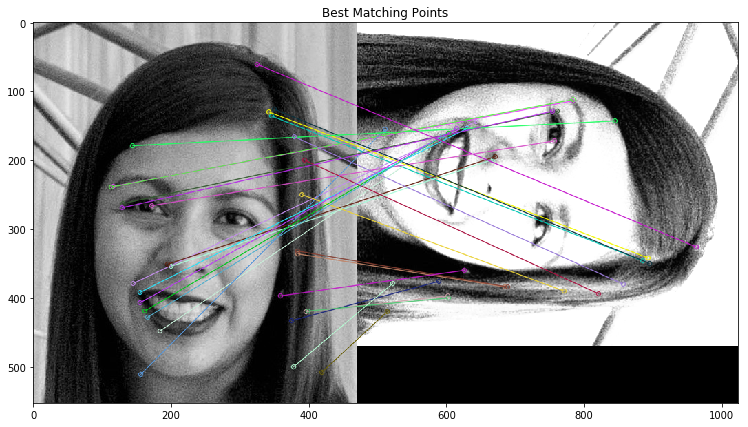

Number of keypoints detected in the training image:  822
Number of keypoints detected in the query image:  841

Number of matching keypoints between the training and query image:  507


In [7]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/faceRI.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, 
                              cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)

plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image,
                             cv2.COLOR_RGB2GRAY)

# Convert the training image to gray scale
query_gray = cv2.cvtColor(query_image,
                             cv2.COLOR_RGB2GRAY)

# Set the parameters of the ORB algorithm by
# specifying the max number of keypoints to
# locate and the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck
# to True so that the BFMatcher will only return
# consistent pairs. Such technique usually produces
# best results with min number of outliers when
# there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, 
                   crossCheck = True)

# Perform the matching between the ORB descriptors of
# the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones 
# we want. So, we sort the matches according
# to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with
# their best matching keypoints in the query image.
# The best matches correspond to the first elements
# in the sorted matches list, since they are the
# ones with the shorter distance. We draw the first
# 30 matches and use flags = 2 to plot the matching
# keypoints without size or orientation
result = cv2.drawMatches(training_gray,
                         keypoints_train,
                         query_gray,
                         keypoints_query,
                         matches[:30],
                         query_gray,
                         flags=2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of the keypoints detected in the
# training image
print("Number of keypoints detected in the training image: ", len(keypoints_train))
# Print the number of the keypoints detected in the
# query image
print("Number of keypoints detected in the query image: ", len(keypoints_query))
# Print total number of matching points between the
# training and query image
print("\nNumber of matching keypoints between the training and query image: ", len(matches))


Brute-Force matcher can still match about 63% of the keypoints found.

## Noise Invariance

The ORB algorithm is also noise invariant. Here, in this example, the query image has a lot of noise.

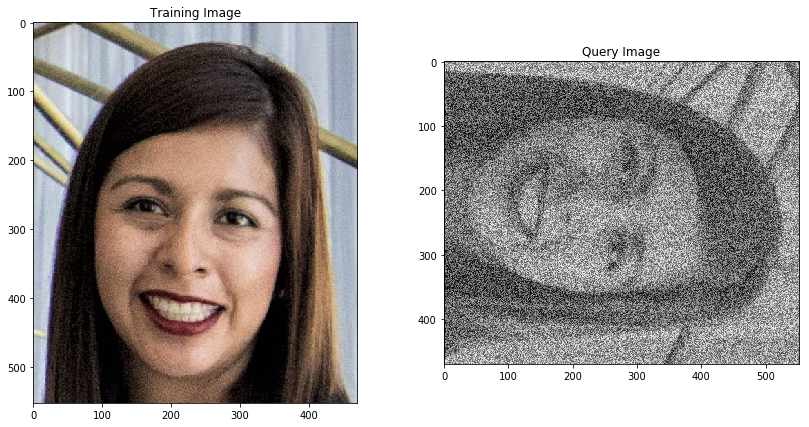

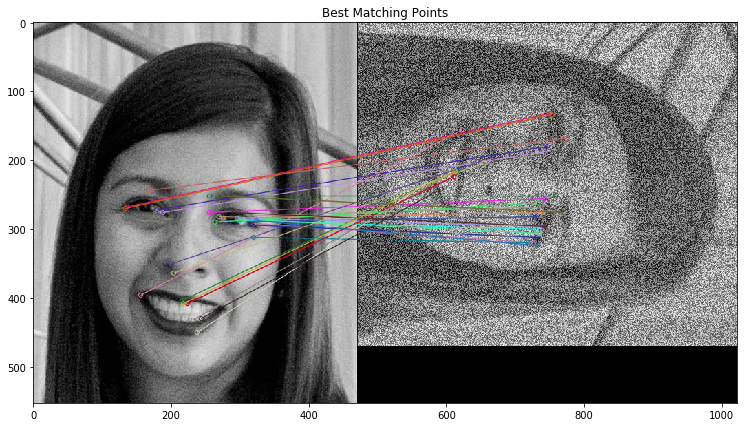

Number of keypoints detected in the training image:  822
Number of keypoints detected in the query image:  878

Number of matching keypoints between the training and query image:  508


In [8]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/faceRN5.png')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, 
                              cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)

plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image,
                             cv2.COLOR_RGB2GRAY)

# Convert the training image to gray scale
query_gray = cv2.cvtColor(query_image,
                             cv2.COLOR_RGB2GRAY)

# Set the parameters of the ORB algorithm by
# specifying the max number of keypoints to
# locate and the pyramid decimation ratio
orb = cv2.ORB_create(1000, 2.0)

# Find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create a Brute Force Matcher object. Set crossCheck
# to True so that the BFMatcher will only return
# consistent pairs. Such technique usually produces
# best results with min number of outliers when
# there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, 
                   crossCheck = True)

# Perform the matching between the ORB descriptors of
# the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones 
# we want. So, we sort the matches according
# to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with
# their best matching keypoints in the query image.
# The best matches correspond to the first elements
# in the sorted matches list, since they are the
# ones with the shorter distance. We draw the first
# 30 matches and use flags = 2 to plot the matching
# keypoints without size or orientation
result = cv2.drawMatches(training_gray,
                         keypoints_train,
                         query_gray,
                         keypoints_query,
                         matches[:30],
                         query_gray,
                         flags=2)

# Display the best matching points
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print the number of the keypoints detected in the
# training image
print("Number of keypoints detected in the training image: ", len(keypoints_train))
# Print the number of the keypoints detected in the
# query image
print("Number of keypoints detected in the query image: ", len(keypoints_query))
# Print total number of matching points between the
# training and query image
print("\nNumber of matching keypoints between the training and query image: ", len(matches))


Brute-Force matcher can still match about 63% of the keypoints found.

# Object Detection

We will now implement the ORB algorithm to detect the face in the trainin image in another image. As usual, we will start by loading our training and query images.

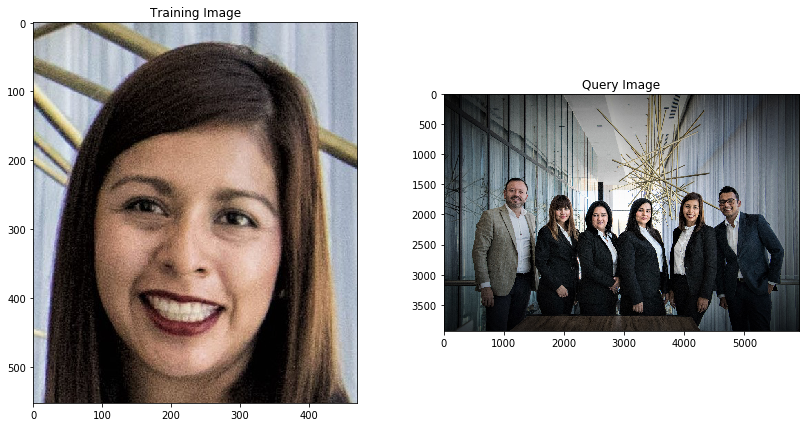

In [10]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [14.0, 7.0]

# Load the training image
image1 = cv2.imread('./images/face.jpeg')

# Load the query image
image2 = cv2.imread('./images/Team.jpeg')

# Convert the training image to RGB
training_image = cv2.cvtColor(image1, 
                              cv2.COLOR_BGR2RGB)

# Convert the query image to RGB
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

# Display the training and query images
plt.subplot(121)
plt.title('Training Image')
plt.imshow(training_image)

plt.subplot(122)
plt.title('Query Image')
plt.imshow(query_image)
plt.show()

In this particular case, the training image contains a faec, there, as we have seen, the majority of the keypoints detected are close to facial features, such as the eyes, nose and mouth. On the other hand, our query image is a picture of a group of people, one of which, is the woman we want to detect.

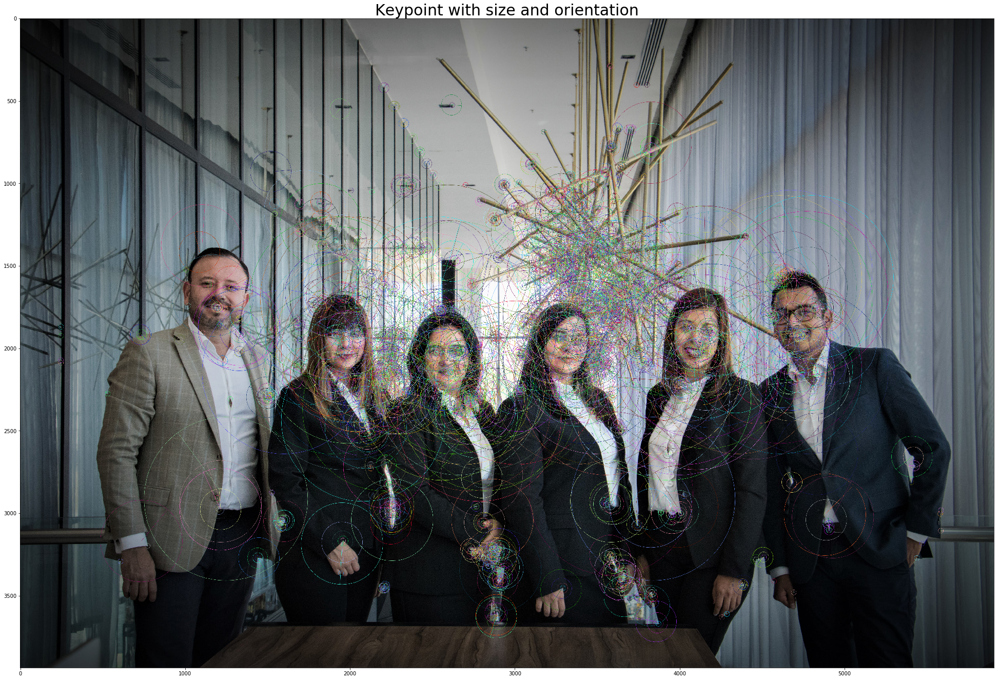


Number of keypoints detected:  4941


In [12]:
import cv2
import matplotlib.pyplot as plt

# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Convert the training image to gray scale
training_gray = cv2.cvtColor(training_image,
                             cv2.COLOR_RGB2GRAY)

# Convert the training image to gray scale
query_gray = cv2.cvtColor(query_image,
                             cv2.COLOR_RGB2GRAY)

# Set the parameters of the ORB algorithm by
# specifying the max number of keypoints to
# locate and the pyramid decimation ratio
orb = cv2.ORB_create(5000, 2.0)

# Find the keypoints
keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

# Create copies of the query images to draw our
# keypoints on
query_img_keyp = copy.copy(query_image)

# Draw the keypoints with size and orientation
# on the copy of the query image
cv2.drawKeypoints(query_image,
                  keypoints_query,
                  query_img_keyp,
                  flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the query image with the keypoints with 
# size and orientation
plt.title('Keypoint with size and orientation', fontsize=30)
plt.imshow(query_img_keyp)
plt.show()

# Print the number of keypoints detected
print("\nNumber of keypoints detected: ", len(keypoints_query))

We can see that the query image has keypoints in many parts of the image. Time to use Brute-Force matcher.

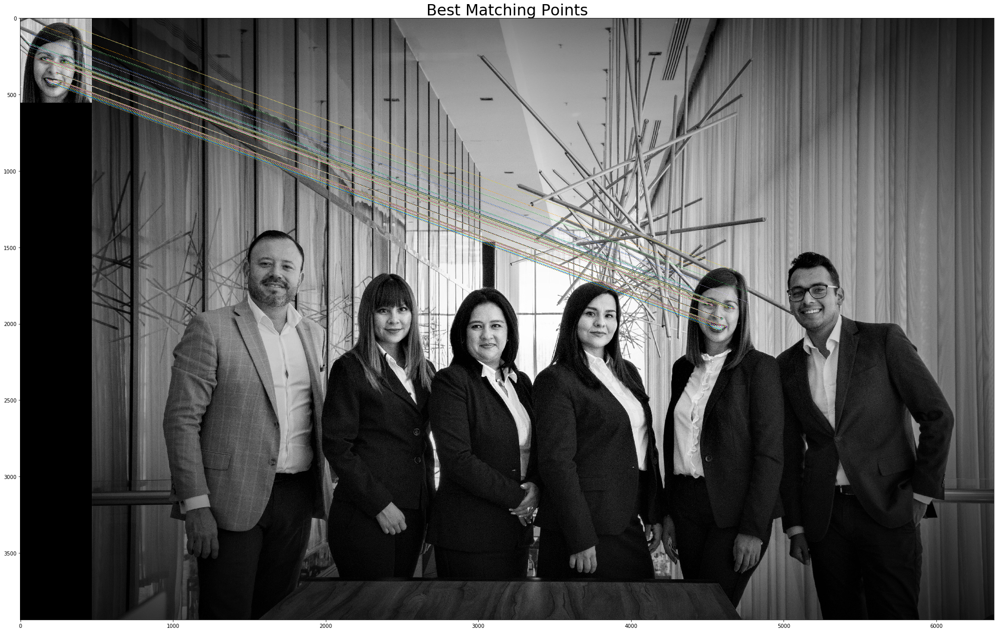

Number of keypoints detected in the training image:  2501
Number of keypoints detected in the query image:  4941

Number of matching keypoints between the training and query image:  1575


In [13]:
# Set the default figure size
plt.rcParams['figure.figsize'] = [34.0, 34.0]

# Create a Brute Force Matcher object. Set crossCheck
# to True so that the BFMatcher will only return
# consistent pairs. Such technique usually produces
# best results with min number of outliers when
# there are enough matches.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, 
                   crossCheck = True)

# Perform the matching between the ORB descriptors of
# the training image and the query image
matches = bf.match(descriptors_train, descriptors_query)

# The matches with shorter distance are the ones 
# we want. So, we sort the matches according
# to distance
matches = sorted(matches, key = lambda x : x.distance)

# Connect the keypoints in the training image with
# their best matching keypoints in the query image.
# The best matches correspond to the first elements
# in the sorted matches list, since they are the
# ones with the shorter distance. We draw the first
# 85 matches and use flags = 2 to plot the matching
# keypoints without size or orientation
result = cv2.drawMatches(training_gray,
                         keypoints_train,
                         query_gray,
                         keypoints_query,
                         matches[:85],
                         query_gray,
                         flags=2)

# We display the image
plt.title('Best Matching Points', fontsize=30)
plt.imshow(result)
plt.show()

# Print the number of the keypoints detected in the
# training image
print("Number of keypoints detected in the training image: ", len(keypoints_train))
# Print the number of the keypoints detected in the
# query image
print("Number of keypoints detected in the query image: ", len(keypoints_query))
# Print total number of matching points between the
# training and query image
print("\nNumber of matching keypoints between the training and query image: ", len(matches))


We can clearly see that even though there are many face and objects in the query image, our Brute-Force matcher ha been able to correctly locate the woman's face in the query image.